This notebook is an exploration of data where an anonymised group of people have answered a number of questions about:

- how well they know each other student (scale from 1 = don't know them, to 5 = we're best friends)
- their student experiences (scale from 1 = I didn't think about doing it, to 5 = I do it almost every day)
- their personality traits (scale from 1 = Not like me at all, to 7 = A lot like me)

Data in the file looks like this:
- unique name,
 - What is your name?,
- personality questions, 
 - "Anxious, easily upset",
 - "Calm, emotionally stable",
 - "Conventional, uncreative",
 - "Critical, quarrelsome",
 - "Dependable, self-disciplined",
 - "Open to new experiences, complex",
 - "Disorganized, careless",
 - "Extraverted, enthusiastic",
 - "Sympathetic, warm",
 - "Reserved, quiet",
- experience qiestions, 
 - Cooked a meal with others,
 - Climbed Arthur's Seat,
 - Cycled,
 - Danced to the music with others,
 - Go to Commonwealth Swimming pool,
 - Go to the university gym (pleasance),
 - Learned some words in a completely new language,
 - Made new friends for life,
 - Performed in a team sports,
 - Read a fiction book,
 - Saw a long-haired ginger Scottish cow,
 - Spoke to a person born in Edinburgh,
 - Tried eating haggis,
 - Visited Botanic Gardens,
 - Visited Castle,
 - Walk around the meadows,
 - Went out for a meal with friends,
 - Went to the cinema,Went to the Student Union,Went to the university library,
- familiarity with other students
 - p0,p1,p10,p11,p12,p13,p14,p15,p16,p17,p18,p19,p2,p20,p21,p22,p23,p24,p25,p26,p27,p28,p29,p3,p4,p5,p6,p7,p8,p9

then each row of data will look like this:

```
p0,6,5,2,2,5,7,2,5,5,4,1,1,1,1,0,0,1,1,1,1,1,1,0,1,0,1,1,1,1,1,5,4,3,2,3,3,3,3,3,4,3,4,3,5,3,3,3,3,3,3,1,4,3,4,4,3,3,4,4,1
p1,5,2,5,5,7,7,5,7,7,1,1,1,0,1,0,1,1,1,1,0,0,1,0,0,1,1,1,0,0,1,5,1,5,2,1,2,2,4,5,5,1,4,5,5,5,2,5,1,3,5,5,5,5,5,2,4,4,4,5,5
```
We will draw some graphs and look at some simple connections between things.

In [ ]:
!pip install --upgrade decorator
!pip install --upgrade networkx
!pip install scipy==1.8.0 # please make sure your scipy version is 1.8.0 in order to run scripy.sparse.coo_array in the package of network
!pip install --upgrade requests

In [1]:
import networkx as nx
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pprint as pp

# Collect network information from dataframe

In [2]:
df = pd.read_csv('data/graph_large.csv', index_col = 0)
print(df)

                    Anxious, easily upset  Calm, emotionally stable  \
What is your name?                                                    
p0                                      6                         5   
p1                                      5                         2   
p3                                      6                         6   
p4                                      6                         5   
p5                                      2                         6   
p6                                      5                         7   
p7                                      5                         6   
p8                                      2                         7   
p9                                      2                         6   
p10                                     6                         3   
p11                                     3                         3   
p12                                     5                         5   
p13   

In [3]:
# Get all columns names
col_names = list(df.columns)
print(col_names)

row_names = df.index.values.tolist()
print(row_names)

['Anxious, easily upset', 'Calm, emotionally stable', 'Conventional, uncreative', 'Critical, quarrelsome', 'Dependable, self-disciplined', 'Open to new experiences, complex', 'Disorganized, careless', 'Extraverted, enthusiastic', 'Sympathetic, warm', 'Reserved, quiet', 'Cooked a meal with others', "Climbed Arthur's Seat", 'Cycled', 'Danced to the music with others', 'Go to Commonwealth Swimming pool', 'Go to the university gym (pleasance)', 'Learned some words in a completely new language', 'Made new friends for life', 'Performed in a team sports', 'Read a fiction book', 'Saw a long-haired ginger Scottish cow', 'Spoke to a person born in Edinburgh', 'Tried eating haggis', 'Visited Botanic Gardens', 'Visited Castle', 'Walk around the meadows', 'Went out for a meal with friends', 'Went to the cinema', 'Went to the Student Union', 'Went to the university library', 'p0', 'p1', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p2', 'p20', 'p21', 'p22', 'p23', 'p24', 'p2

In [4]:
# First 10 attributes are personality questions
personality_questions = col_names[:10]
print(personality_questions)

['Anxious, easily upset', 'Calm, emotionally stable', 'Conventional, uncreative', 'Critical, quarrelsome', 'Dependable, self-disciplined', 'Open to new experiences, complex', 'Disorganized, careless', 'Extraverted, enthusiastic', 'Sympathetic, warm', 'Reserved, quiet']


In [5]:
# Last 30 attributes are anonymised students
people = col_names[-30:]
print(people)

['p0', 'p1', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p2', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26', 'p27', 'p28', 'p29', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9']


In [6]:
# The remaining parts are experience questions
experiences_questions = col_names[10:-30]
print(experiences_questions)

['Cooked a meal with others', "Climbed Arthur's Seat", 'Cycled', 'Danced to the music with others', 'Go to Commonwealth Swimming pool', 'Go to the university gym (pleasance)', 'Learned some words in a completely new language', 'Made new friends for life', 'Performed in a team sports', 'Read a fiction book', 'Saw a long-haired ginger Scottish cow', 'Spoke to a person born in Edinburgh', 'Tried eating haggis', 'Visited Botanic Gardens', 'Visited Castle', 'Walk around the meadows', 'Went out for a meal with friends', 'Went to the cinema', 'Went to the Student Union', 'Went to the university library']


# Build the network with weights

In [7]:
G = nx.path_graph(4)
pos = nx.spring_layout(G)
plt.show()

In [8]:
DG = nx.DiGraph()
for row, row_values in df.iterrows():
    print('\nNode: ', row)
    for column, column_values in enumerate(row_values):
        #### optional: only keep connections >3
        isThisAPersonColumn = df.columns[column] in people
        if(column_values > 3 and isThisAPersonColumn): # only connect nodes if this is a 'person' column
            print('Connected to ', df.columns[column], ' with weight: ', column_values)
            DG.add_edge(row, df.columns[column], weight=column_values)


Node:  p0
Connected to  p0  with weight:  5
Connected to  p1  with weight:  4
Connected to  p17  with weight:  4
Connected to  p19  with weight:  4
Connected to  p20  with weight:  5
Connected to  p28  with weight:  4
Connected to  p3  with weight:  4
Connected to  p4  with weight:  4
Connected to  p7  with weight:  4
Connected to  p8  with weight:  4

Node:  p1
Connected to  p0  with weight:  5
Connected to  p10  with weight:  5
Connected to  p15  with weight:  4
Connected to  p16  with weight:  5
Connected to  p17  with weight:  5
Connected to  p19  with weight:  4
Connected to  p2  with weight:  5
Connected to  p20  with weight:  5
Connected to  p21  with weight:  5
Connected to  p23  with weight:  5
Connected to  p26  with weight:  5
Connected to  p27  with weight:  5
Connected to  p28  with weight:  5
Connected to  p29  with weight:  5
Connected to  p3  with weight:  5
Connected to  p5  with weight:  4
Connected to  p6  with weight:  4
Connected to  p7  with weight:  4
Connected 

# Visualisation

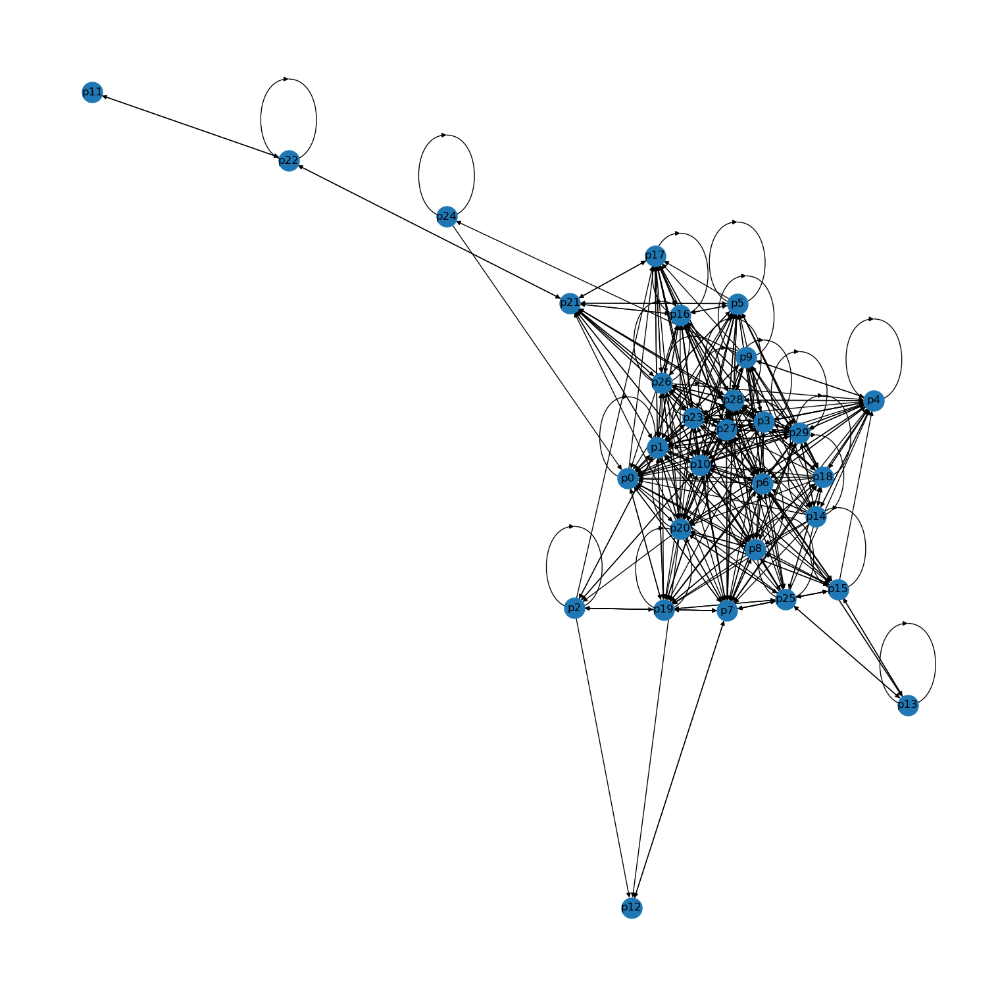

In [9]:
plt.rcParams['figure.figsize'] = [15, 15]
# Note: we will reuse the same spring layout thoughout the graphs
pos = nx.spring_layout(DG)

nx.draw(DG, pos, with_labels= True, node_size = 500)
plt.show()

# Styling plots with graph metrics

In [10]:
degree = nx.degree_centrality(DG)
betweenness = nx.betweenness_centrality(DG)
pagerank = nx.pagerank(DG)
hits = nx.hits(DG)

{'p0': 1.0344827586206897,
 'p1': 1.3448275862068966,
 'p10': 1.5517241379310345,
 'p11': 0.06896551724137931,
 'p12': 0.13793103448275862,
 'p13': 0.27586206896551724,
 'p14': 0.7241379310344828,
 'p15': 0.7586206896551724,
 'p16': 0.9655172413793103,
 'p17': 0.7586206896551724,
 'p18': 0.9310344827586207,
 'p19': 0.896551724137931,
 'p2': 0.4482758620689655,
 'p20': 1.2413793103448276,
 'p21': 0.7586206896551724,
 'p22': 0.20689655172413793,
 'p23': 1.1724137931034482,
 'p24': 0.13793103448275862,
 'p25': 0.896551724137931,
 'p26': 1.0,
 'p27': 1.4137931034482758,
 'p28': 1.5172413793103448,
 'p29': 1.1379310344827587,
 'p3': 1.1724137931034482,
 'p4': 1.0,
 'p5': 0.9655172413793103,
 'p6': 1.4482758620689655,
 'p7': 1.1724137931034482,
 'p8': 1.0,
 'p9': 0.7586206896551724}


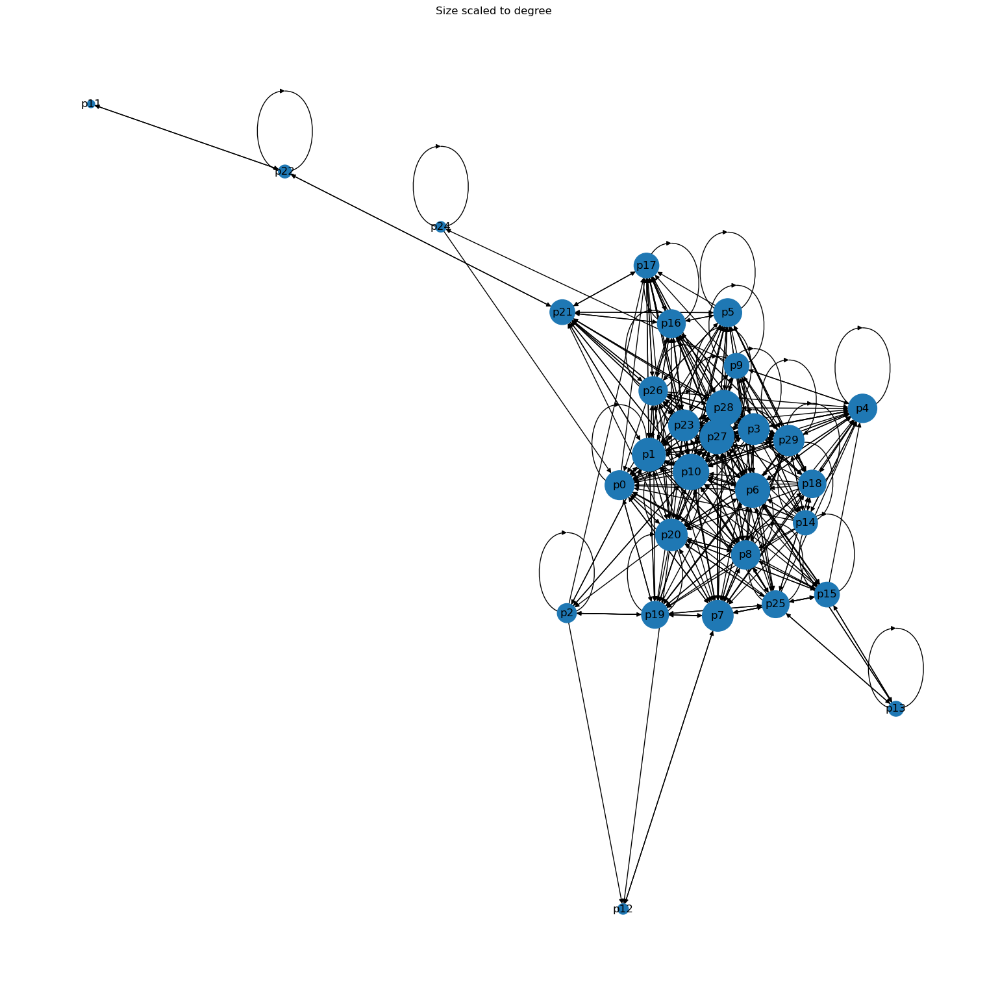

In [11]:
pp.pprint(degree)

# pos = nx.spring_layout(DG)

size = [value * 1000 for value in degree.values()]

nx.draw(DG, pos, with_labels= True, node_size = size)
plt.title("Size scaled to degree")
plt.show()

{'p0': 0.04172488021010188,
 'p1': 0.06437917585859897,
 'p10': 0.07515397096673948,
 'p11': 0.0,
 'p12': 0.0,
 'p13': 0.0,
 'p14': 0.0021760629425546965,
 'p15': 0.011805254816338564,
 'p16': 0.005592935872202751,
 'p17': 0.008546063409689894,
 'p18': 0.014374321806320093,
 'p19': 0.01090500304433254,
 'p2': 0.003644096319187345,
 'p20': 0.040754132090764186,
 'p21': 0.13336555685693616,
 'p22': 0.06896551724137931,
 'p23': 0.017236656136612672,
 'p24': 0.00010262725779967159,
 'p25': 0.020189313585525143,
 'p26': 0.008973326691017216,
 'p27': 0.03555699731201791,
 'p28': 0.059856214125179955,
 'p29': 0.012304684662925185,
 'p3': 0.02289984539088454,
 'p4': 0.024145812179762638,
 'p5': 0.00836101481023243,
 'p6': 0.06027600757507337,
 'p7': 0.07087677979283123,
 'p8': 0.0073357399386086725,
 'p9': 0.0374930829980091}


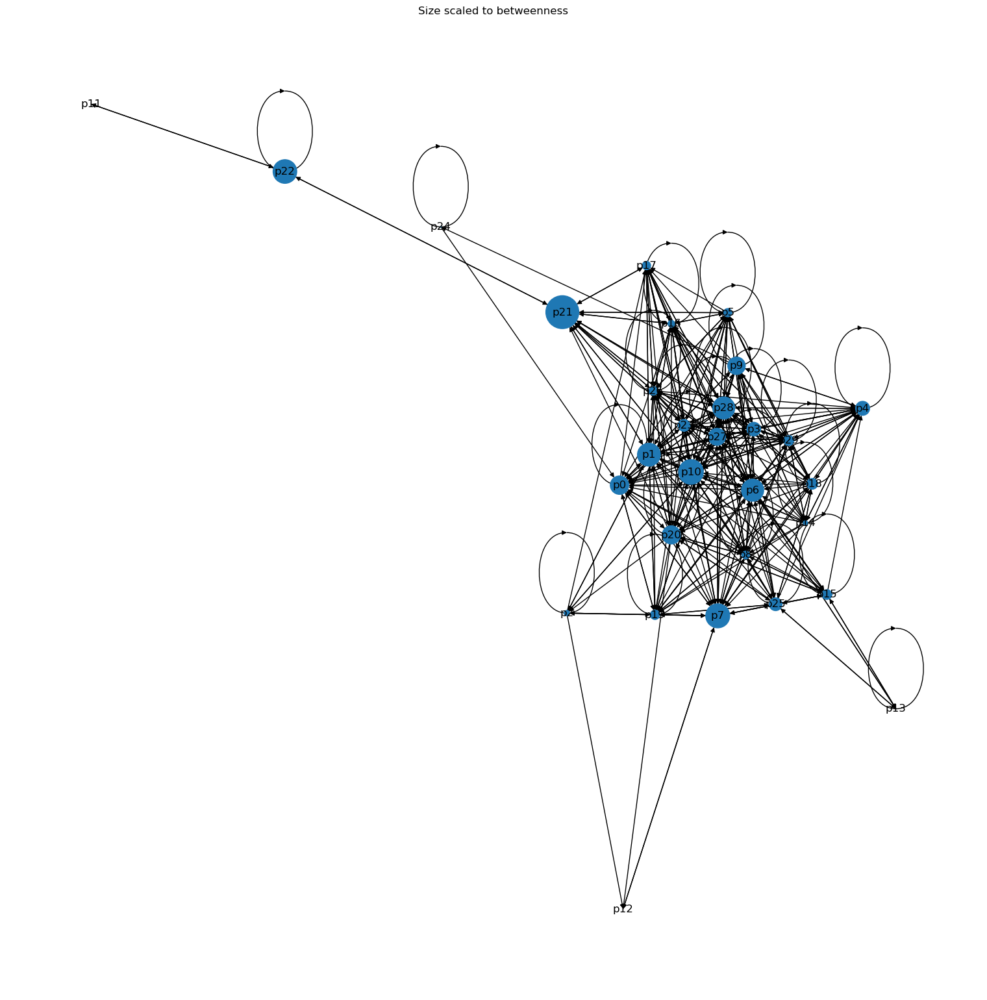

In [12]:
pp.pprint(betweenness)

# pos = nx.spring_layout(DG)

size = [value * 10000 for value in betweenness.values()]

nx.draw(DG, pos, with_labels= True, node_size = size)
plt.title("Size scaled to betweenness")
plt.show()

{'p0': 0.047797172610746466,
 'p1': 0.04522358520170956,
 'p10': 0.052819025191820246,
 'p11': 0.012478714726407315,
 'p12': 0.012201537342660697,
 'p13': 0.014763211479452455,
 'p14': 0.016232910835876777,
 'p15': 0.029242616869095527,
 'p16': 0.03538055491410709,
 'p17': 0.03568554561851063,
 'p18': 0.02783070136467265,
 'p19': 0.037962779068266964,
 'p2': 0.021197101178799294,
 'p20': 0.040275466786697564,
 'p21': 0.0357034574240678,
 'p22': 0.026387453217174707,
 'p23': 0.036273814827115294,
 'p24': 0.011207726318886679,
 'p25': 0.031854836089143225,
 'p26': 0.033771345136527756,
 'p27': 0.04898089921543283,
 'p28': 0.052451408874630054,
 'p29': 0.035497897718803975,
 'p3': 0.030976261857342025,
 'p4': 0.04113514983612197,
 'p5': 0.03205954763982578,
 'p6': 0.050788416469232225,
 'p7': 0.05053754202365336,
 'p8': 0.03551703506909104,
 'p9': 0.017766285094127893}


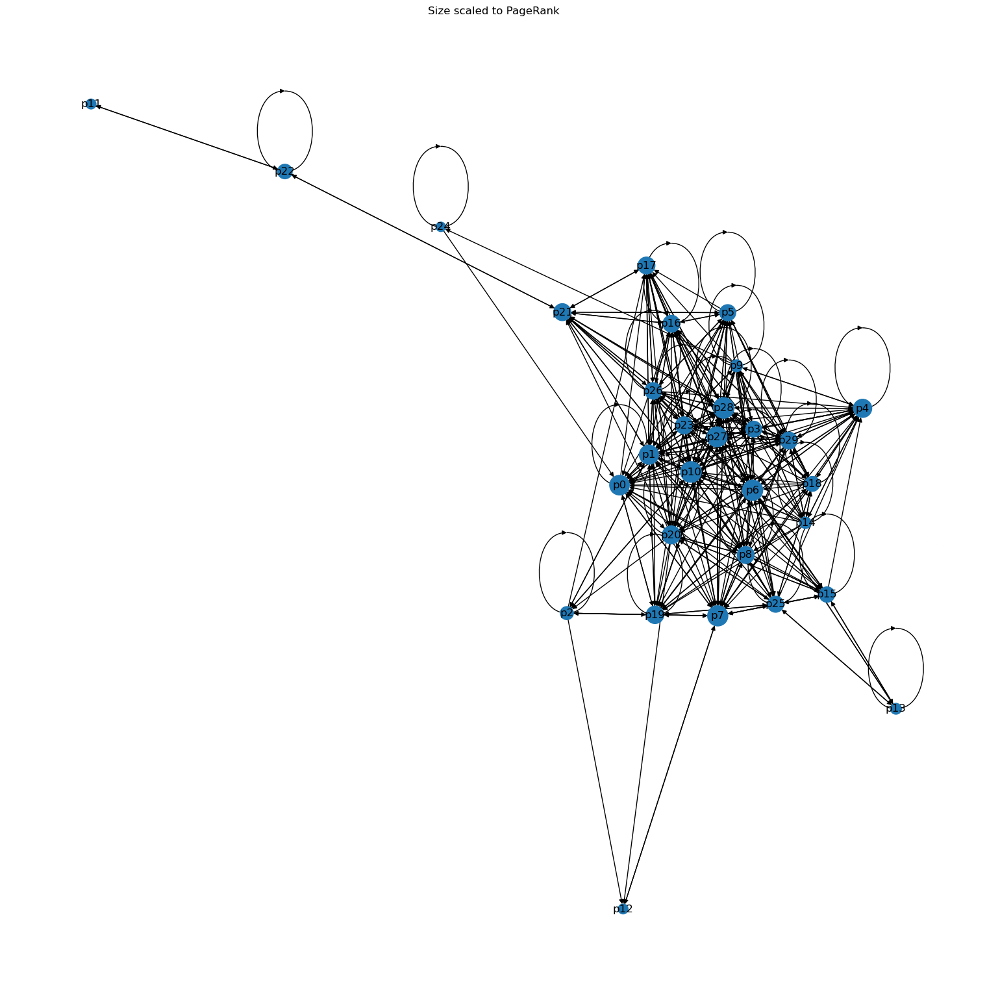

In [13]:
pp.pprint(pagerank)

# pos = nx.spring_layout(DG)

size = [value * 10000 for value in pagerank.values()]

nx.draw(DG, pos, with_labels= True, node_size = size)
plt.title("Size scaled to PageRank")
plt.show()

{'p0': 0.0259623175135745,
 'p1': 0.0549623429699402,
 'p10': 0.055009394811411115,
 'p11': 0.00014478900423845064,
 'p12': 0.0024934692771532625,
 'p13': 0.008626042475364706,
 'p14': 0.03599972244648076,
 'p15': 0.027721243759766,
 'p16': 0.03908599241262641,
 'p17': 0.020879668999413598,
 'p18': 0.03856189901838351,
 'p19': 0.02118278920148001,
 'p2': 0.014056225498413084,
 'p20': 0.04967712870468101,
 'p21': 0.026735093099611723,
 'p22': 0.0025157465954898286,
 'p23': 0.05481262333006833,
 'p24': 0.0028255520053338794,
 'p25': 0.034499260059405,
 'p26': 0.045636605501348036,
 'p27': 0.05485874844149054,
 'p28': 0.0570470559845772,
 'p29': 0.04669576047127366,
 'p3': 0.05043839471346283,
 'p4': 0.028383635952418666,
 'p5': 0.036912579727346795,
 'p6': 0.05665420118745399,
 'p7': 0.03451848353904365,
 'p8': 0.03813839674882971,
 'p9': 0.03496483654991971}


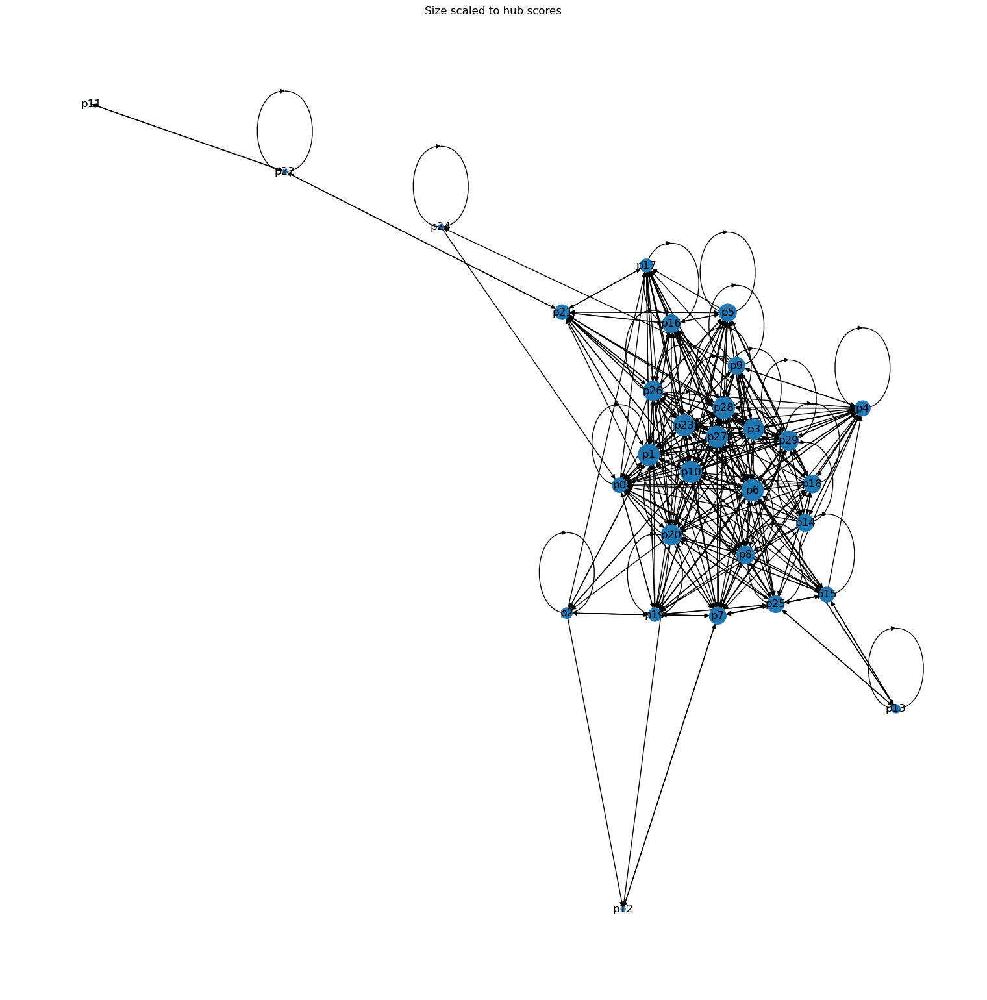

In [14]:
pp.pprint(hits[0])

# pos = nx.spring_layout(DG)

size = [value * 10000 for value in hits[0].values()]

nx.draw(DG, pos, with_labels= True, node_size = size)
plt.title("Size scaled to hub scores")
plt.show()

{'p0': 0.047247245532321035,
 'p1': 0.044321052717828546,
 'p10': 0.05830242251178964,
 'p11': 0.00017516518567529675,
 'p12': 0.006164604115259623,
 'p13': 0.008088622045179754,
 'p14': 0.017258290746426763,
 'p15': 0.02938208875183391,
 'p16': 0.04135134789698372,
 'p17': 0.03844108159898688,
 'p18': 0.02556597819671749,
 'p19': 0.038941485369737155,
 'p2': 0.01451518275796576,
 'p20': 0.043757820626172964,
 'p21': 0.03334080981621777,
 'p22': 0.0020467445999502887,
 'p23': 0.04158588393628004,
 'p24': 0.0021443479325061704,
 'p25': 0.02843196716220173,
 'p26': 0.038750300059220116,
 'p27': 0.055865850939818024,
 'p28': 0.05542738770528798,
 'p29': 0.04448826712308783,
 'p3': 0.035628372281958566,
 'p4': 0.04692918631488852,
 'p5': 0.04119924810836929,
 'p6': 0.05603548957122983,
 'p7': 0.04405975789562141,
 'p8': 0.041251115761919935,
 'p9': 0.019302882738563933}


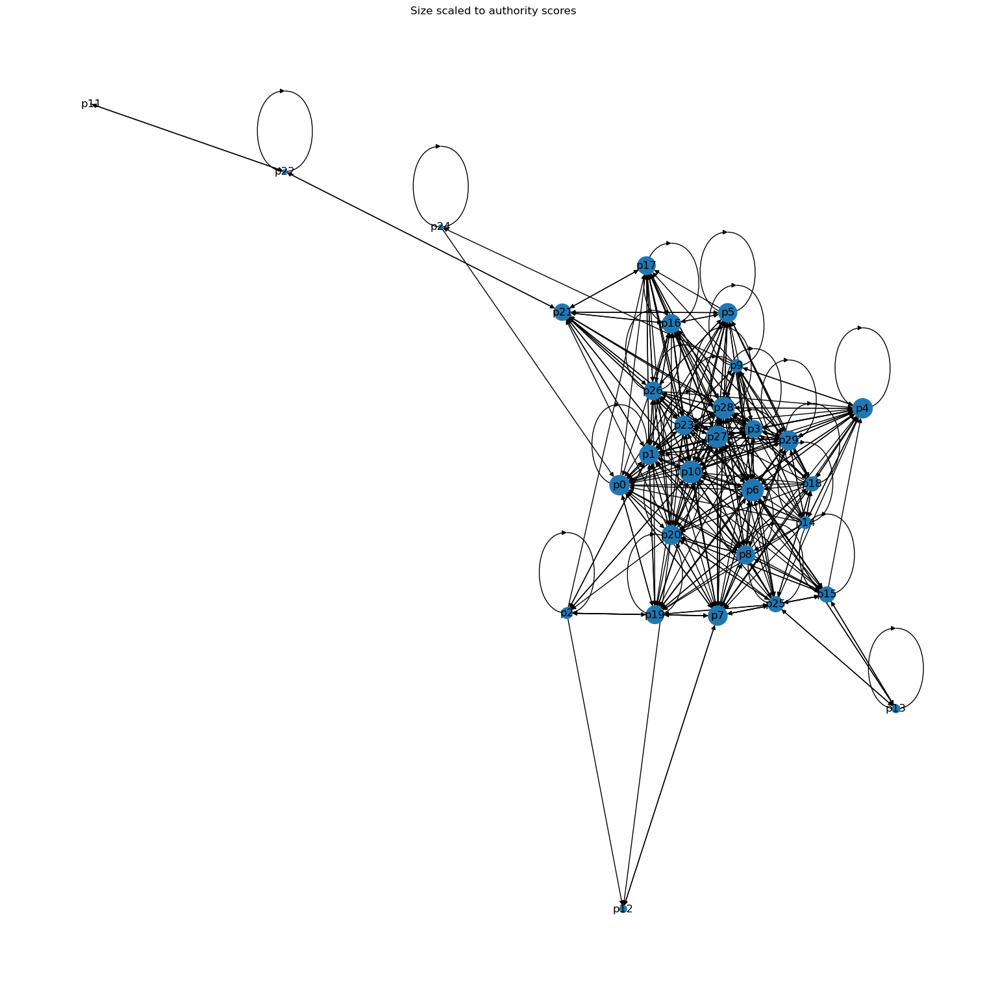

In [15]:
pp.pprint(hits[1])

# pos = nx.spring_layout(DG)

size = [value * 10000 for value in hits[1].values()]

nx.draw(DG, pos, with_labels= True, node_size = size)
plt.title("Size scaled to authority scores")
plt.show()

# Look at experience and personality

Edinburgh Experiences


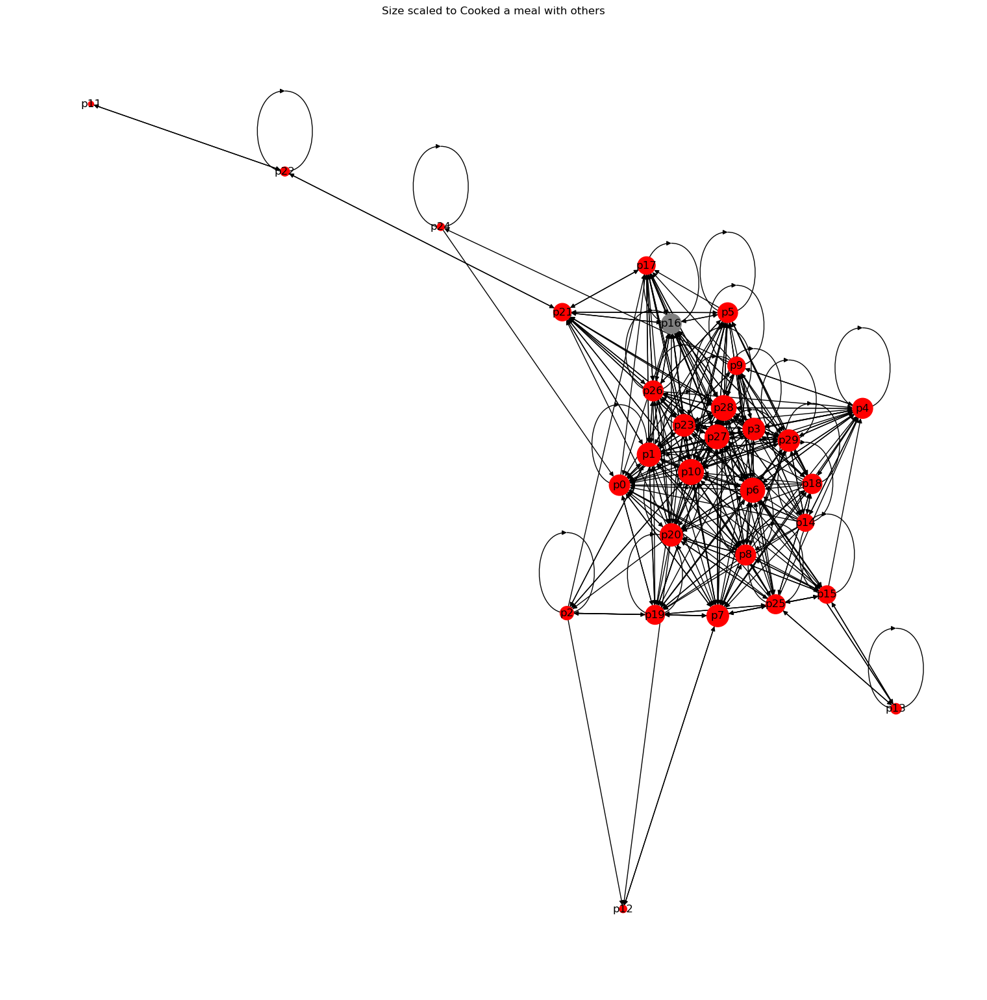

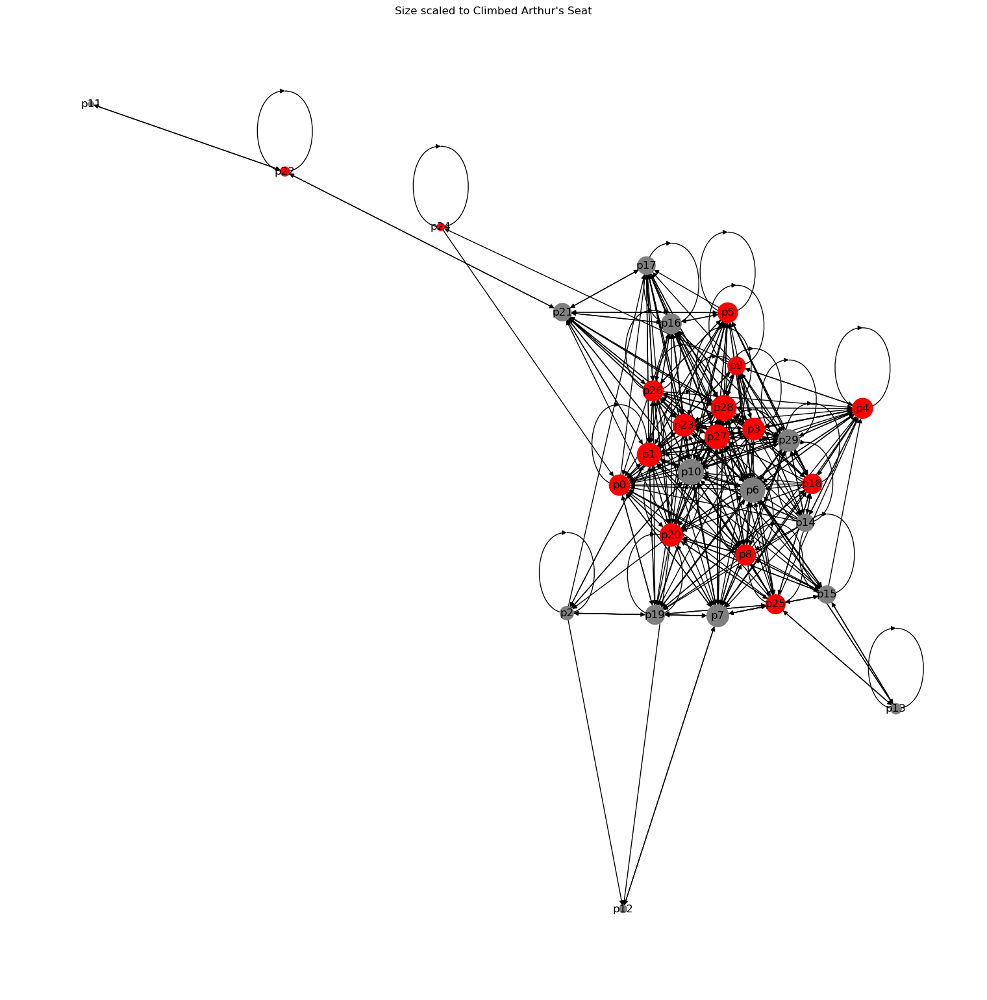

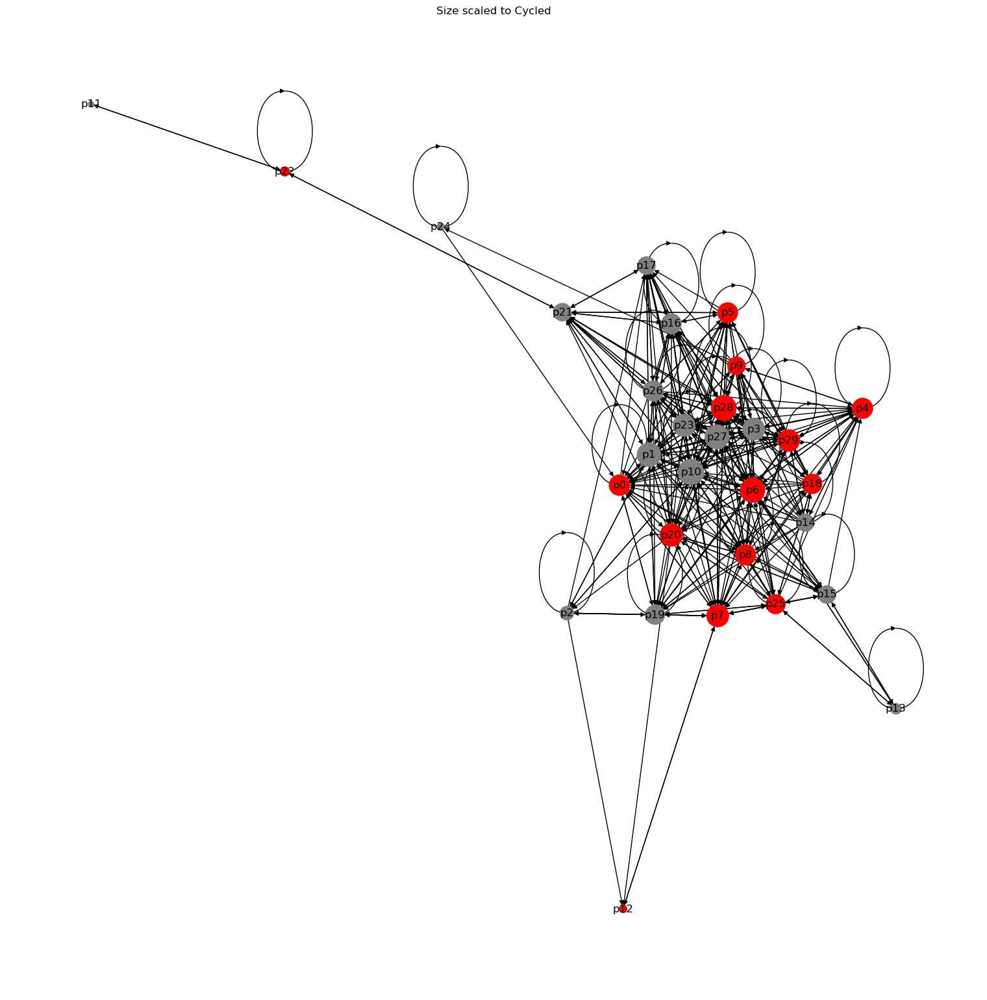

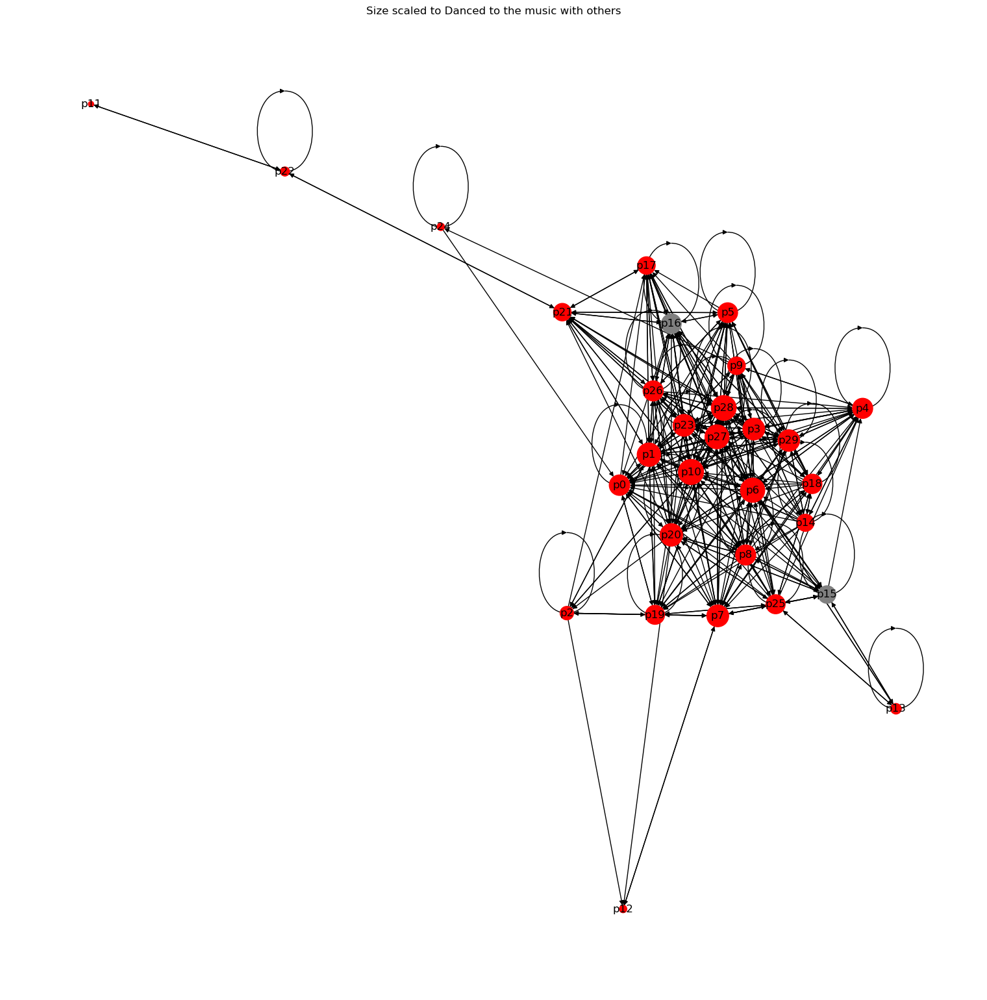

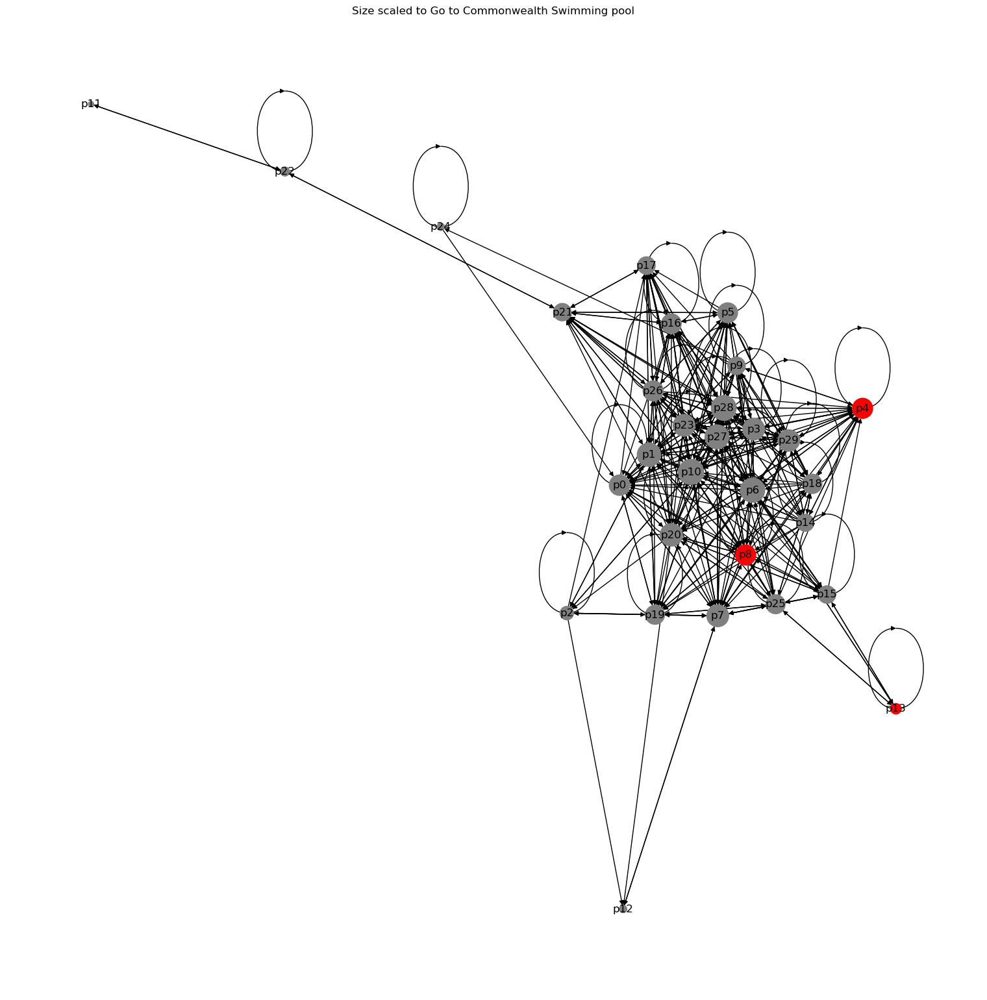

...

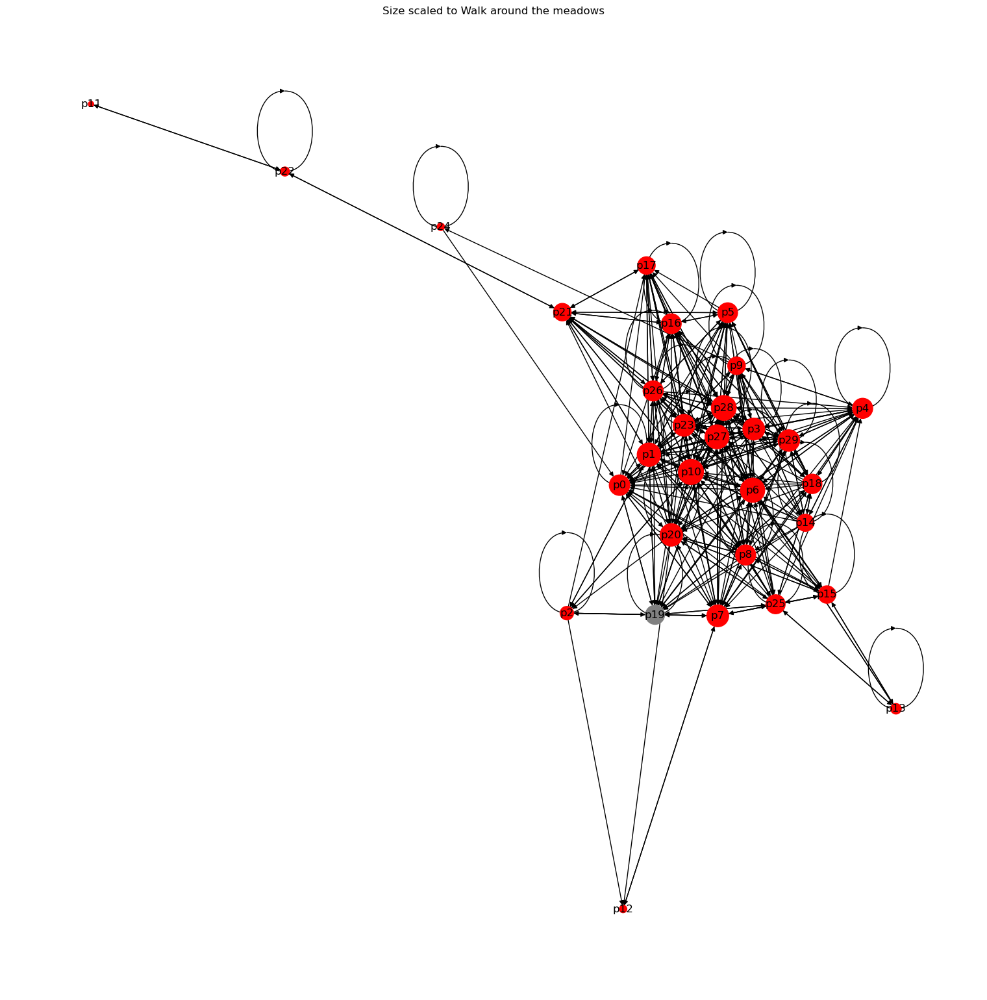

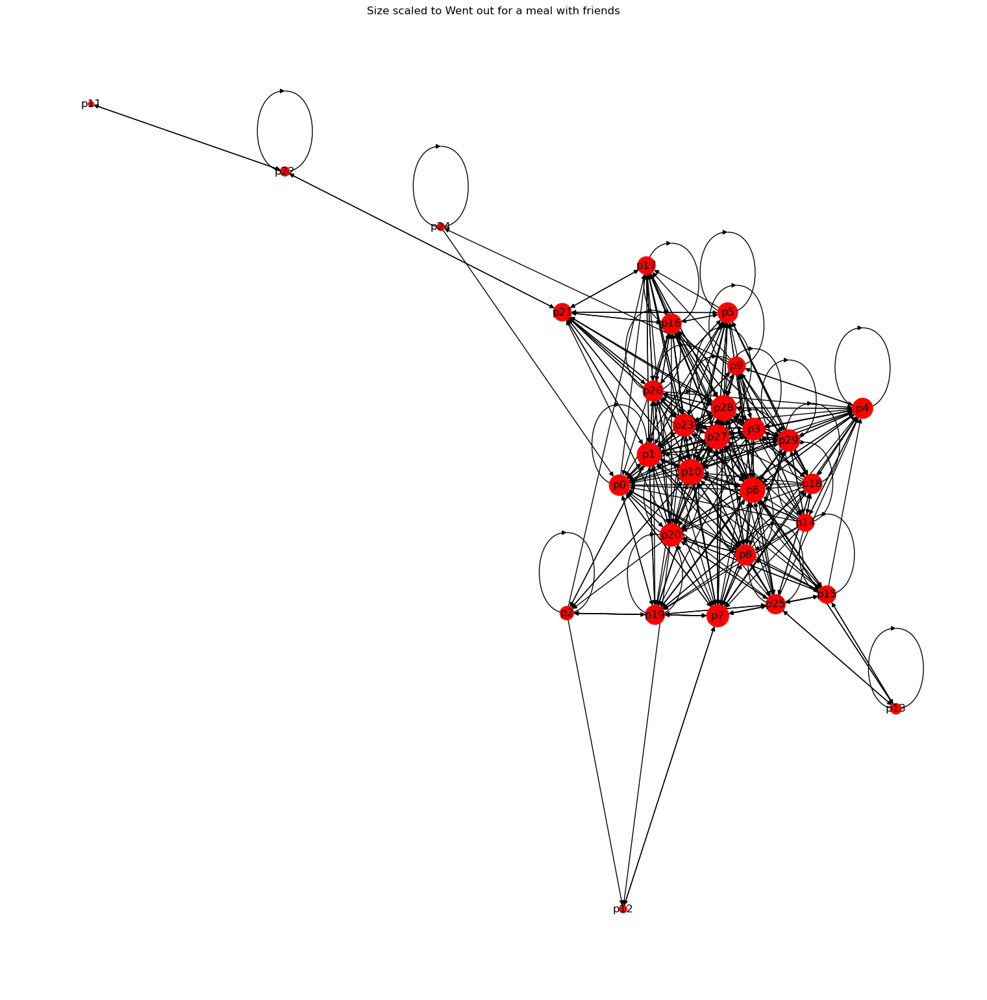

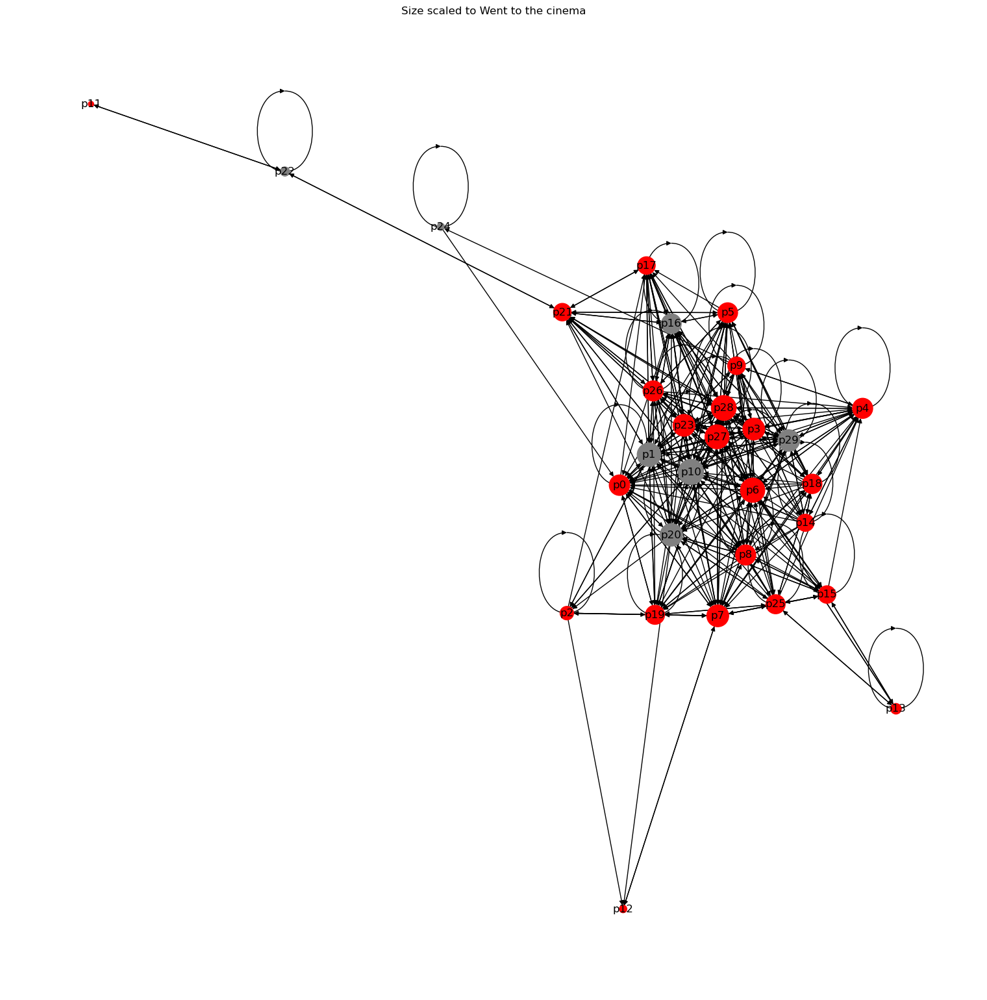

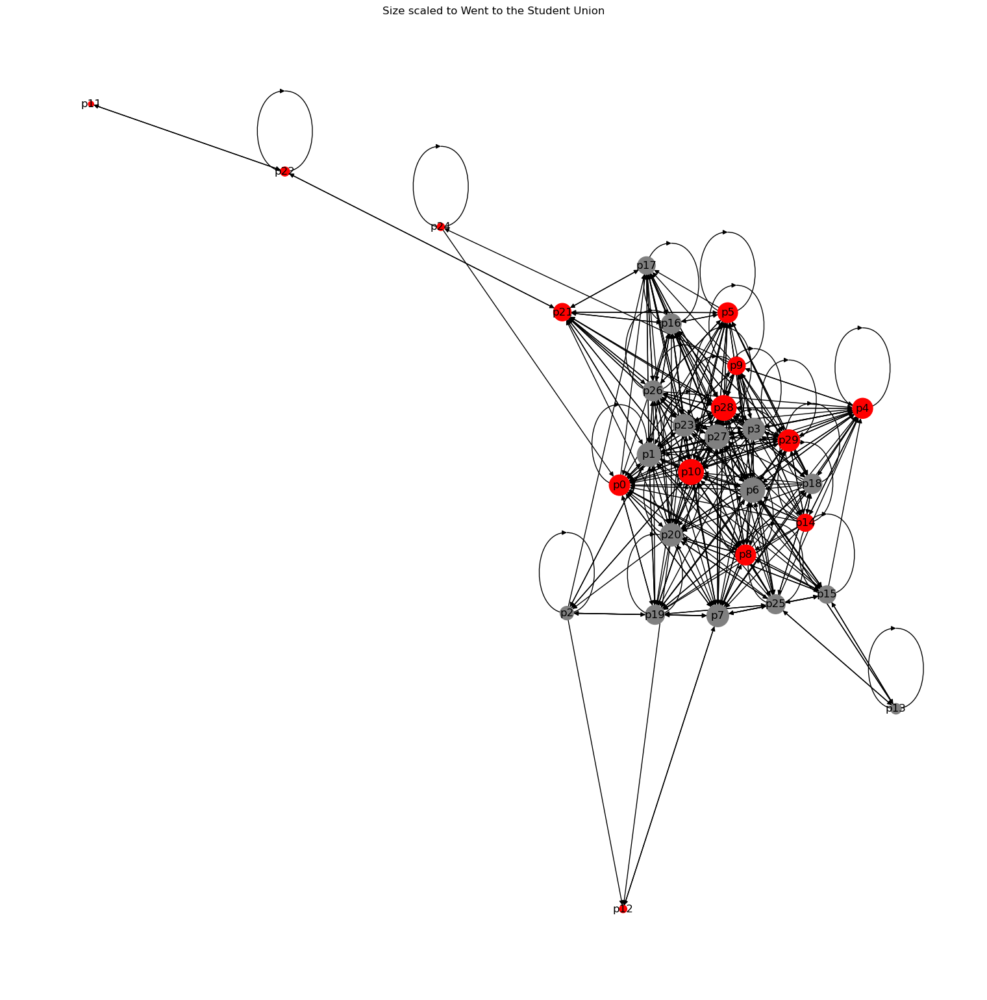

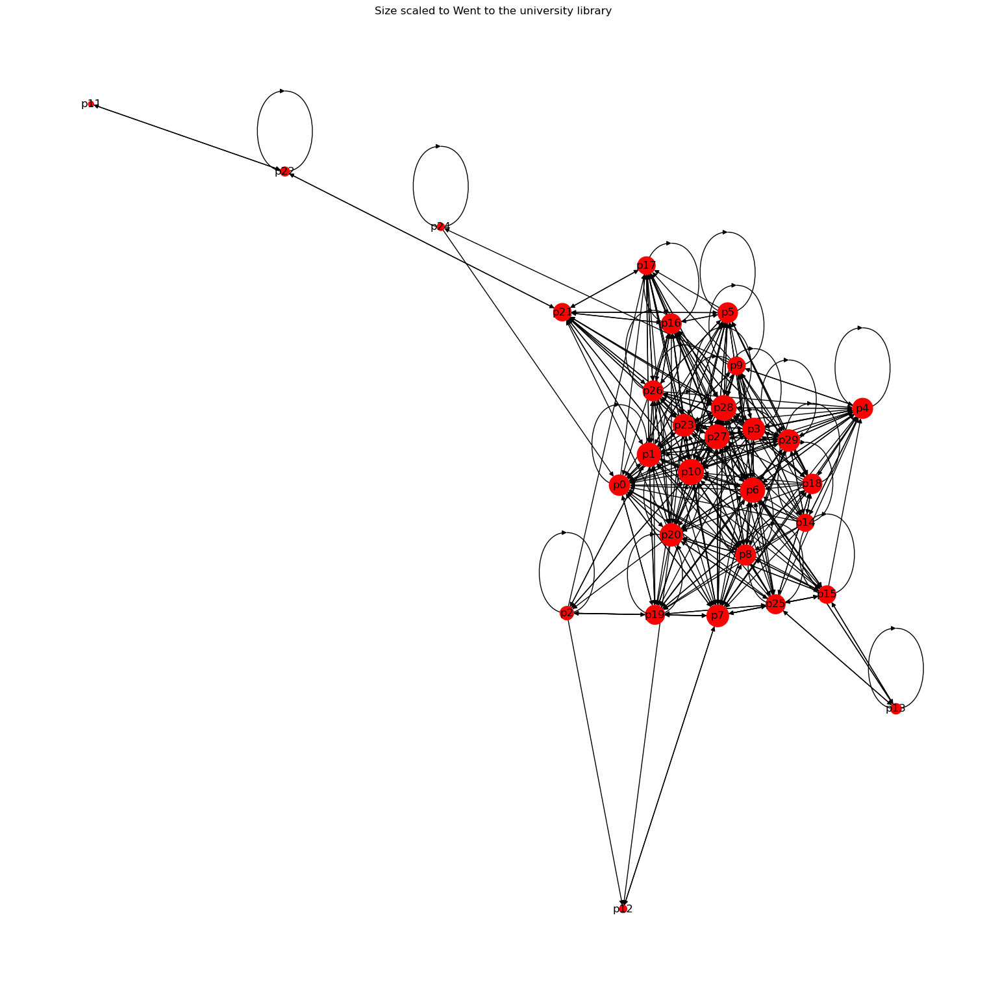

In [16]:
# this cell will take a long time to render.
# if your notebook froze completely, in the menu you can Kernel > Restart

print("Edinburgh Experiences")

# pos = nx.spring_layout(DG)

# experiences_questions personality_questions
size = [value * 500 for value in degree.values()]

for experience in experiences_questions:
    colors =  ['red' if value == 1 else 'grey' for value in df[experience]]
    nx.draw(DG, pos, with_labels= True, node_size = size, node_color = colors)
    plt.title(f"Size scaled to {experience}")
    plt.show()

In [ ]:
print("personality")

# pos = nx.spring_layout(DG)

for personality in personality_questions:
    size = [value * 500 for value in df[personality]]
    nx.draw(DG, pos, with_labels= True, node_size = size, cmap=plt.cm.Blues)
    plt.title(f"Size scaled to {personality}")
    plt.show()

# Do you have any better visualistion idea?